# 1. **Installing**


In [1]:
!git clone https://github.com/openvinotoolkit/anomalib.git
%cd anomalib
%pip install .
%pip install -r requirements/core.txt
%pip install scikit-learn openvino==2024.0.0

Cloning into 'anomalib'...
remote: Enumerating objects: 8959, done.
remote: Counting objects: 100% (1686/1686), done.
remote: Compressing objects: 100% (1269/1269), done.
remote: Total 8959 (delta 760), reused 1039 (delta 364), pack-reused 7273
Receiving objects: 100% (8959/8959), 58.31 MiB | 40.89 MiB/s, done.
Resolving deltas: 100% (5036/5036), done.
/content/anomalib
Processing /content/anomalib
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 1.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 189.7/189.7 kB 3.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 11.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for anomalib: filename=anomalib-1.1.0.dev0-py3-none-any.whl size=398847 sha256=8f9f2980ea6e9e644ef2dd508936da6657b9a85320e0fd1b7fd41ced8d8d1f68
  Stored in direc

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.8/33.8 MB 31.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.6/44.6 kB 6.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 569.1/569.1 kB 60.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 549.1/549.1 kB 52.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 101.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 670.2/670.2 MB 1.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 841.5/841.5 kB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 801.6/801.6 kB 3.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 3.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 3.5 MB/

# 2. **Training**

In [6]:
from anomalib.data import MVTec
from anomalib.models import Fastflow
from anomalib.engine import Engine
from lightning.pytorch.callbacks import EarlyStopping, ModelCheckpoint

def run():

	datamodule = MVTec()
	model = Fastflow(backbone="resnet18", flow_steps=8)
	engine = Engine(callbacks=[
	    ModelCheckpoint(
	        mode="max",
	        monitor="pixel_AUROC",
	    ),
	    EarlyStopping(
	        monitor="pixel_AUROC",
	        mode="max",
	        patience=3,
	    )],
	    pixel_metrics="AUROC",
	    accelerator="auto",
	    devices=1,
	    logger=False,
    )

	engine.fit(datamodule=datamodule, model=model)
	engine.test(datamodule=datamodule, model=model)

if __name__ == '__main__':
    run()

INFO: GPU available: False, used: False
INFO:lightning.pytorch.utilities.rank_zero:GPU available: False, used: False
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/loops/utilities.py:73: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
mvtec: 5.26GB [03:29, 25.1MB/s]                            
Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth
INFO: 
  | Name                  | Type                     | Params
------------------------------------------------------------

Training: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/lightning/pytorch/core/module.py:494: You called `self.log('train_loss', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│        image_AUROC        │    0.9944444894790649     │
│       image_F1Score       │    0.9763779640197754     │
│        pixel_AUROC        │     0.971767246723175     │
└───────────────────────────┴───────────────────────────┘

# 3. **Predicting & Visualizing**

INFO: GPU available: False, used: False
INFO:lightning.pytorch.utilities.rank_zero:GPU available: False, used: False
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: Restoring states from the checkpoint path at /content/anomalib/results/Fastflow/MVTec/bottle/v0/weights/lightning/model.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at /content/anomalib/results/Fastflow/MVTec/bottle/v0/weights/lightning/model.ckpt
INFO: Loaded model weights from the checkpoint at /content/anomalib/results/Fastflow/MVTec/bottle/v0/weights/lightning/model.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Loaded model weights from the checkpoi

Predicting: |          | 0/? [00:00<?, ?it/s]

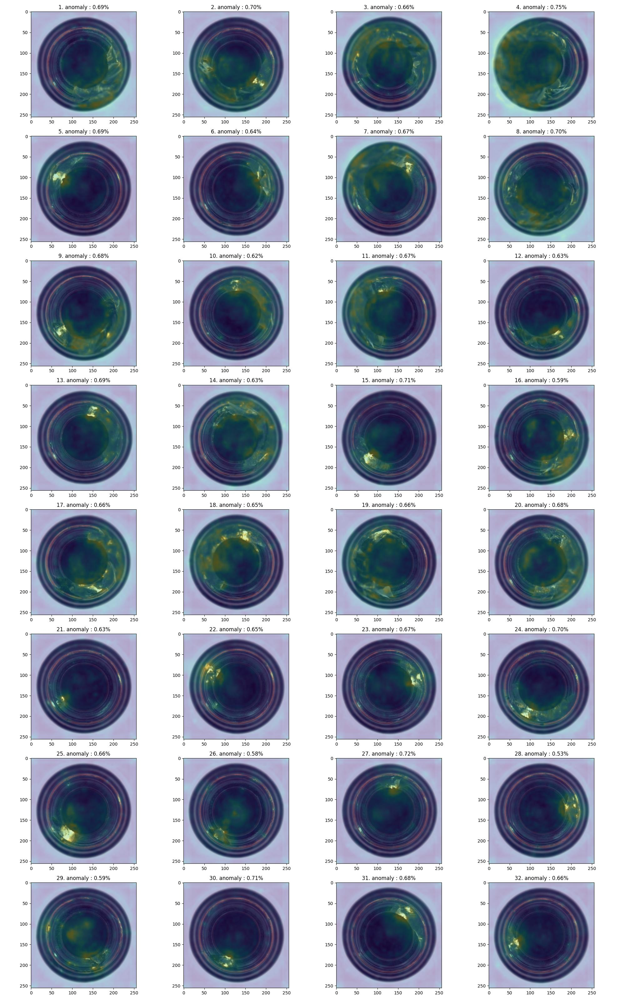

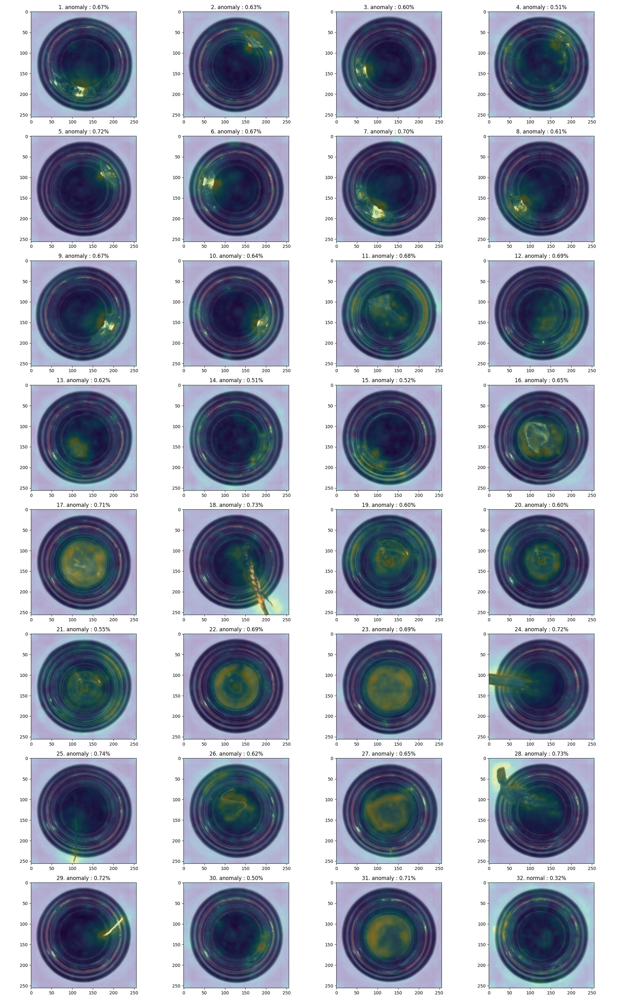

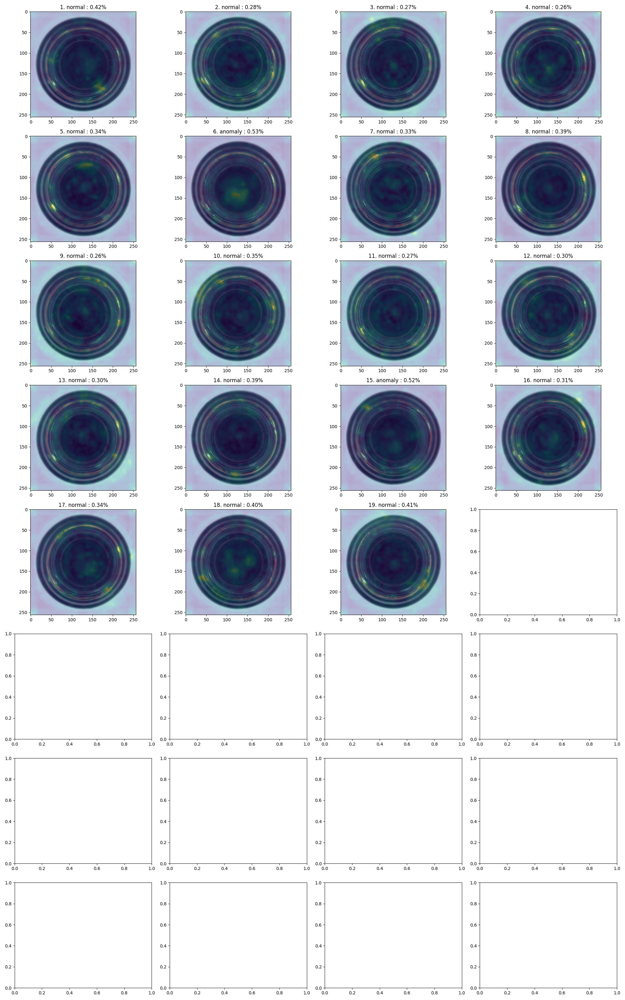

In [9]:
from PIL import Image
import matplotlib.pyplot as plt

from anomalib.data import MVTec
from anomalib.models import Fastflow
from anomalib.engine import Engine

def run():

    datamodule = MVTec()
    model = Fastflow()
    engine = Engine()

    predictions = engine.predict(
        datamodule=datamodule,
        model=model,
        ckpt_path="results/Fastflow/MVTec/bottle/latest/weights/lightning/model.ckpt",)

    for i, prediction in enumerate(predictions):
        fig, axes = plt.subplots(8, 4, figsize=(20, 32))

        for j, image in enumerate(prediction['image']):

            score = prediction["pred_scores"][j]
            label = "anomaly" if prediction["pred_labels"][j] else "normal"

            image = prediction['image'][j].permute(1, 2, 0).numpy()
            anomaly = prediction['anomaly_maps'][j].permute(1, 2, 0).numpy()
            image = image - image.min()
            image = image / image.max()

            row, col = int(j / 4), int(j % 4)

            axes[row][col].imshow(image)
            axes[row][col].imshow(anomaly, alpha=0.33)
            axes[row][col].set_title(f'{j + 1}. {label} : {score:0.2f}%')

        plt.tight_layout()
        plt.savefig(f'fastflow-results-{i}.jpg')
        plt.close()

        im = Image.open(f'fastflow-results-{i}.jpg')
        display(im)

if __name__ == '__main__':
    run()